# Advance Lane Detection

In [19]:
import numpy as np
import cv2
import glob

In [71]:
import matplotlib.pyplot as plt
%matplotlib inline

# debug functions to easily display a test image
def display_to(img, dst):
    if len(img.shape) == 3 and img.shape[2] == 3:
        dst.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    elif len(img.shape) == 3 and img.shape[2] == 1:
        dst.imshow(img[:,:,0],cmap='gray')
    else:
        dst.imshow(img, cmap='gray')

def display_image(img):
    plt.figure()
    display_to(img, plt)
    plt.axis('off')
    plt.show()
    
def display_images(left, right, l_title='', r_title='', main_title=''):
    fig, axes = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(20,6))  
    display_to(left, axes[0])
    display_to(right, axes[1])
    axes[0].set_title(l_title)
    axes[1].set_title(r_title)
    fig.suptitle(main_title)
    for ax in axes:
        ax.axis('off')
    plt.show()
    
def display_image_grid(imgs, titles, cols, rows):
    fig, axes = plt.subplots(rows, cols, sharex=True, sharey=True, figsize=(24,4))  
    
    for idx, img in enumerate(imgs):
        display_to(img, axes[idx])
        axes[idx].set_title(titles[idx])
        axes[idx].axis('off')
    plt.show()

## Camera Calibration

In [6]:
CALIBRATION_MASK = 'camera_cal/calibration*.jpg'
GRID_X=9
GRID_Y=6

In [8]:
from camera import Camera

Loading calibration data


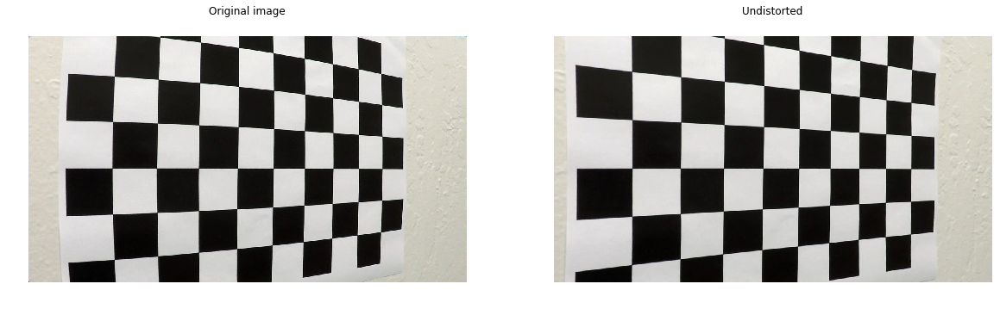

In [11]:
camera = Camera('camera_udacity')
if not camera.calibrate(CALIBRATION_MASK, GRID_X, GRID_Y):
    print ("ERROR CALIBRATING CAMERA")
    
img = cv2.imread('camera_cal/calibration5.jpg')
display_images(img, camera.undistort(img), 'Original image', 'Undistorted')

## Undistort

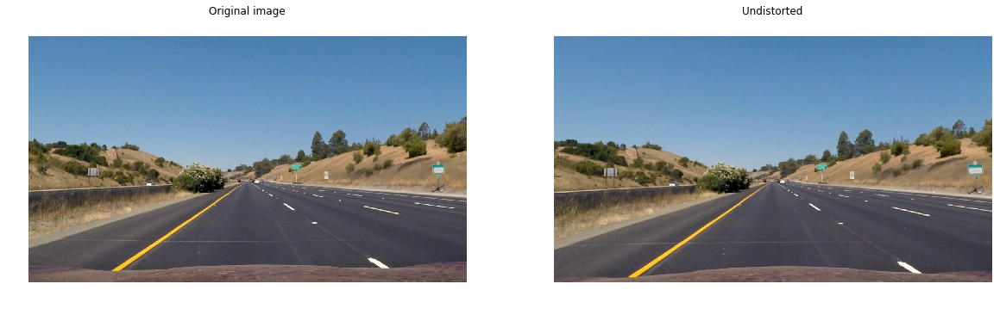

In [12]:
img = cv2.imread('test_images/straight_lines1.jpg')
corrected = camera.undistort(img)
display_images(img, corrected, 'Original image', 'Undistorted')

## Threshold

In [32]:
from pipeline import LaneDetectionPipeline
pipeline = LaneDetectionPipeline(camera)

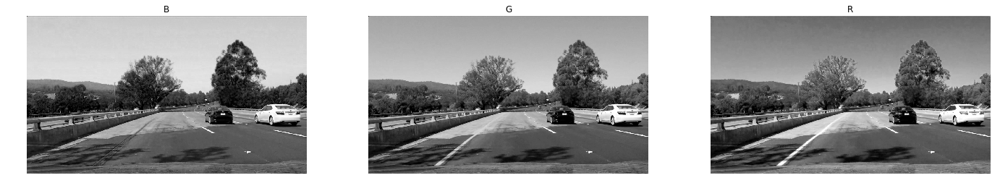

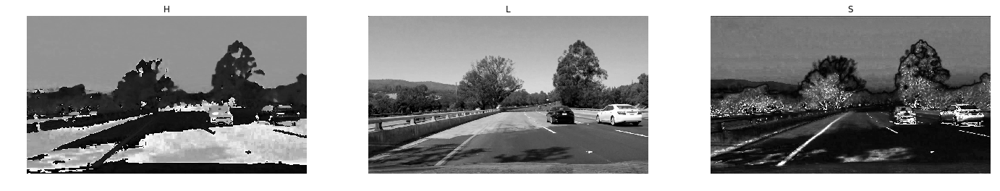

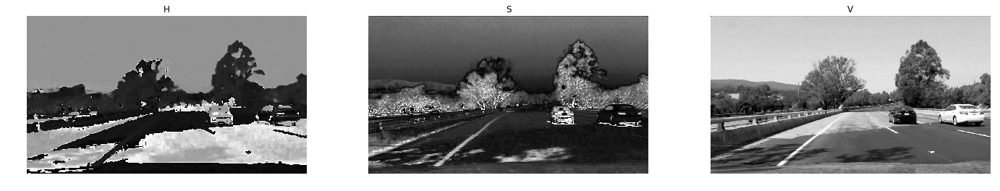

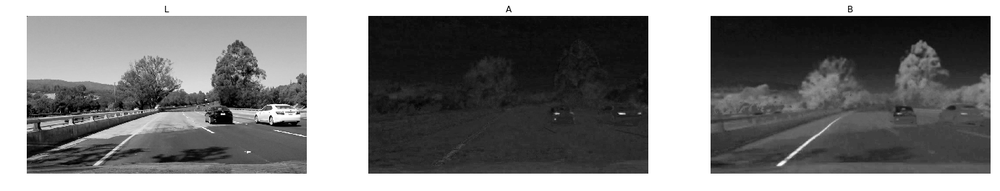

In [73]:
img = cv2.imread('test_images/test4.jpg')

hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

display_image_grid([img[:,:,0], img[:,:,1], img[:,:,2]], ['B', 'G', 'R'], 3, 1)
display_image_grid([hls[:,:,0], hls[:,:,1], hls[:,:,2]], ['H', 'L', 'S'], 3, 1)
display_image_grid([hsv[:,:,0], hsv[:,:,1], hsv[:,:,2]], ['H', 'S', 'V'], 3, 1)
display_image_grid([lab[:,:,0], lab[:,:,1], lab[:,:,2]], ['L', 'A', 'B'], 3, 1)

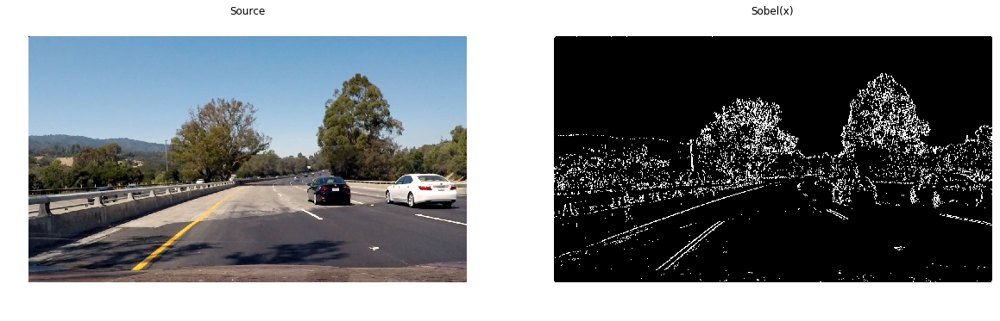

In [76]:
img = cv2.imread('test_images/test4.jpg')
binary = pipeline.gradient_threshold(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
display_images(img, binary, 'Source', 'Sobel(x)')

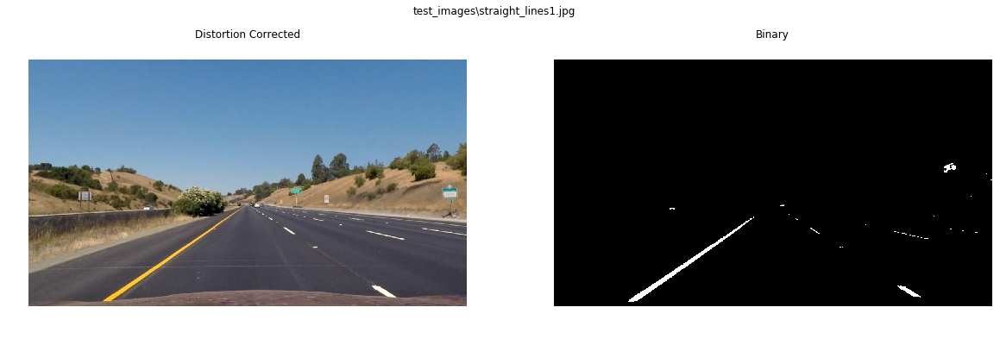

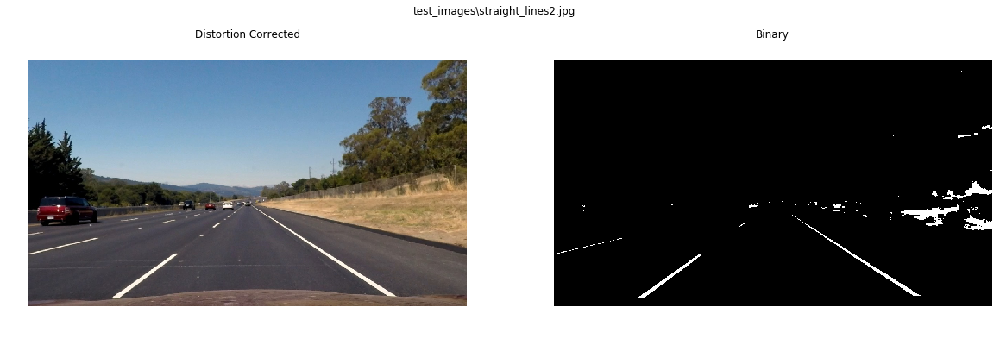

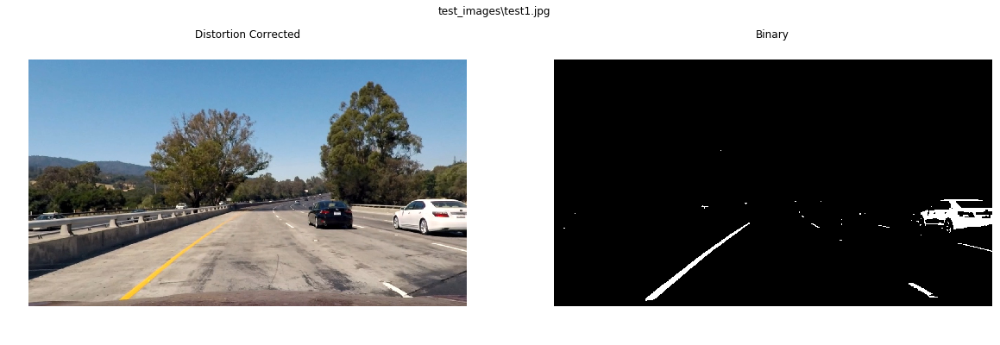

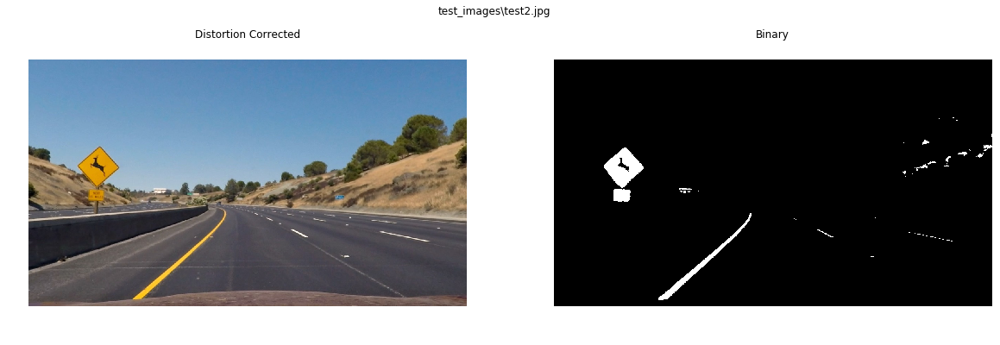

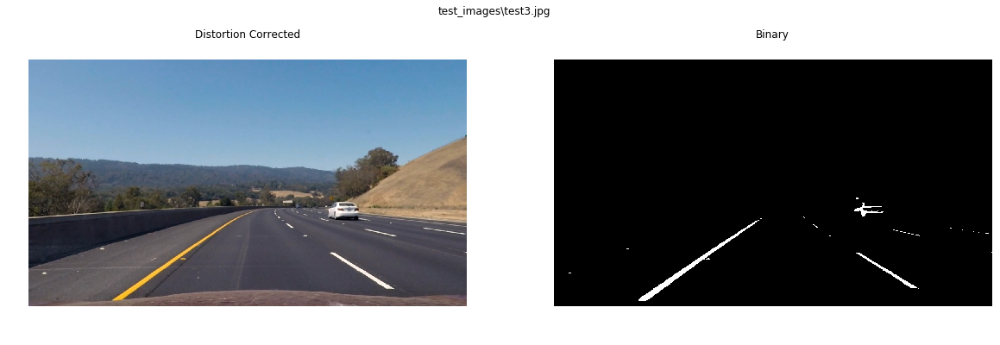

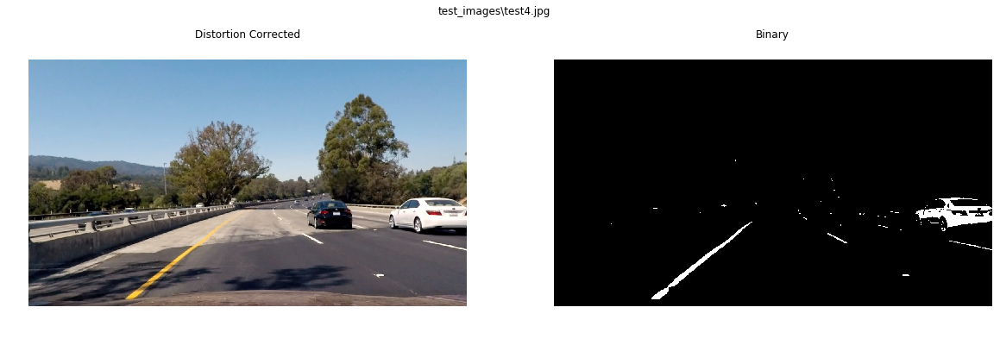

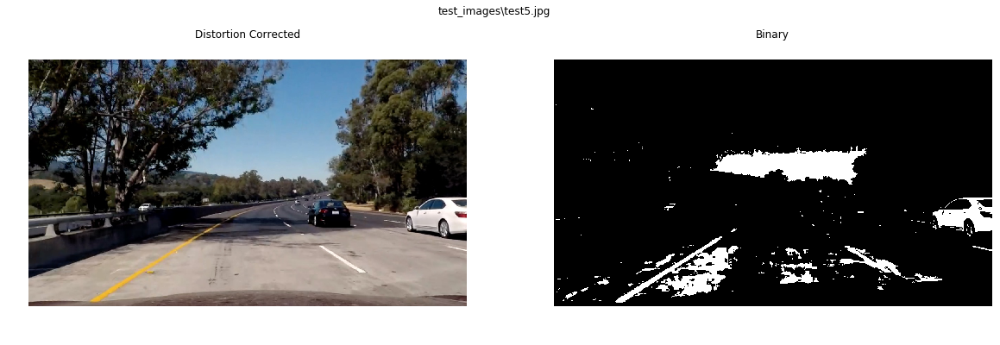

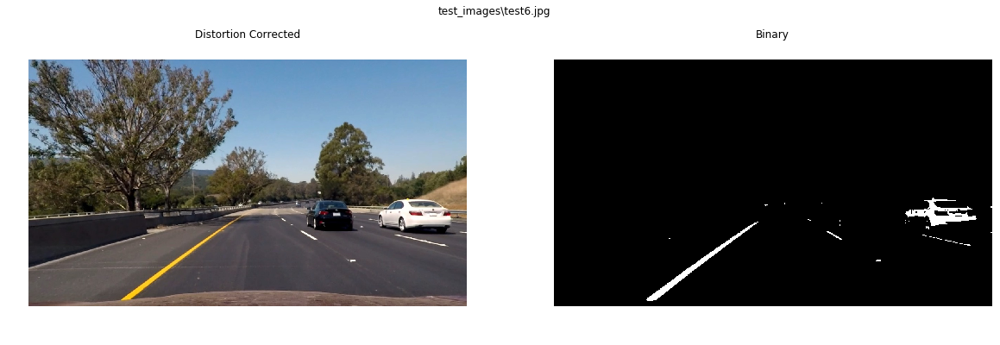

In [31]:
for file in glob.glob('test_images/*.jpg'):
    img = cv2.imread(file)
    
    corrected = pipeline.undistort(img)
    binary = pipeline.threshold(corrected)
    
    display_images(corrected, binary, 'Distortion Corrected', 'Binary', file)


## Perspective transformation

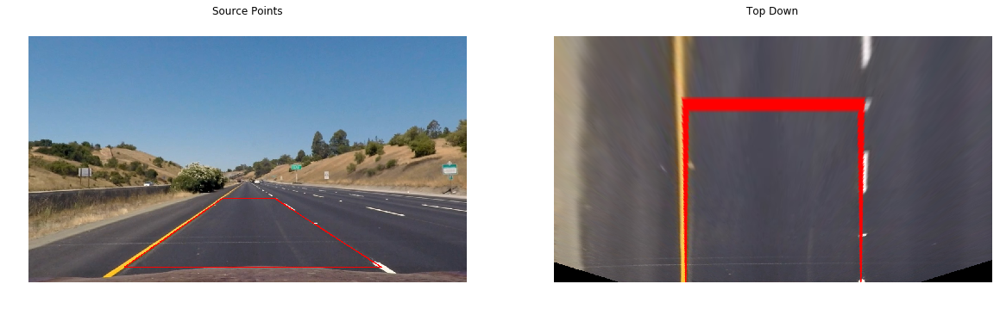

In [96]:
img = pipeline.undistort(cv2.imread('test_images/straight_lines1.jpg'))

src_points = np.float32([[565,475], [720,475], [1030,675], [280,675]])
dst_points = np.float32([[384,200], [896,200], [896,720], [384,720]])
        
persp_M = cv2.getPerspectiveTransform(src_points, dst_points)

cv2.polylines(img, [np.int32(src_points)], True, [0, 0, 255], 2)

topdown = cv2.warpPerspective(img, persp_M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

display_images(img, topdown, "Source Points", "Top Down")


test_images\straight_lines1.jpg


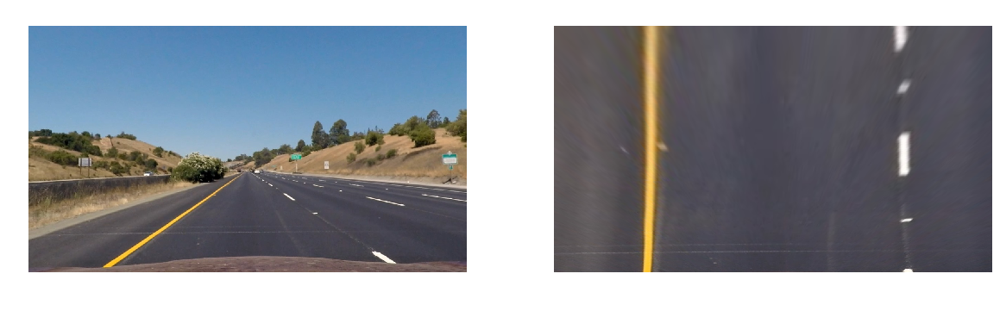

test_images\straight_lines2.jpg


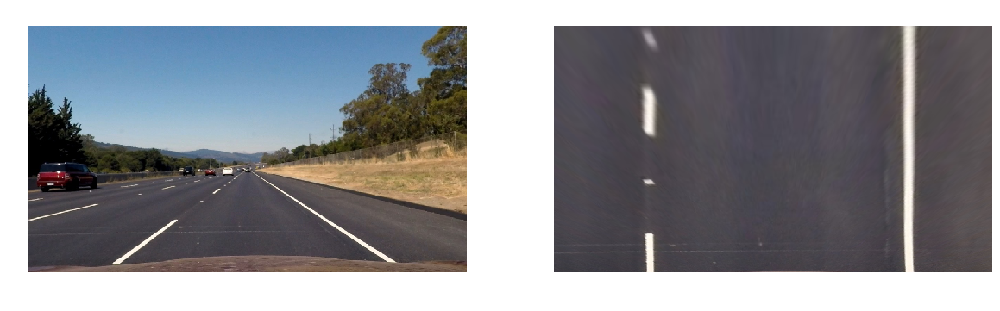

test_images\test1.jpg


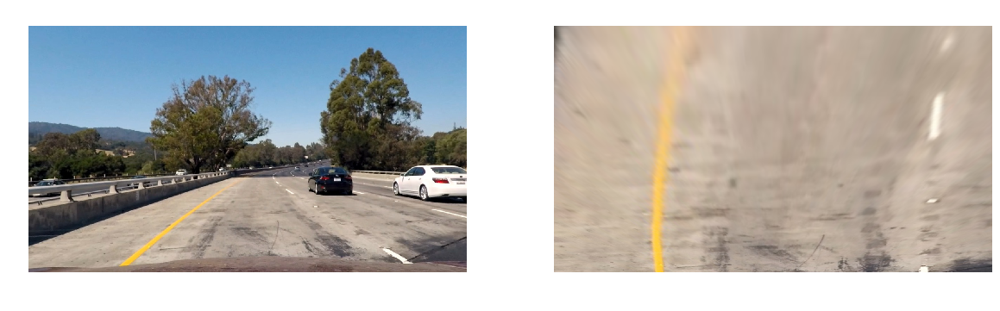

test_images\test2.jpg


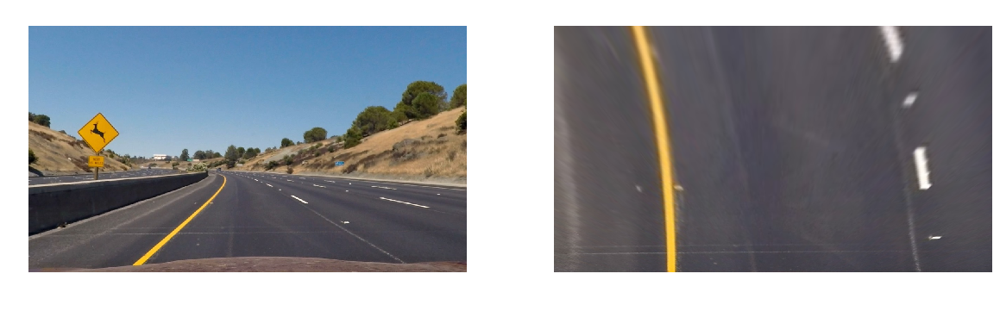

test_images\test3.jpg


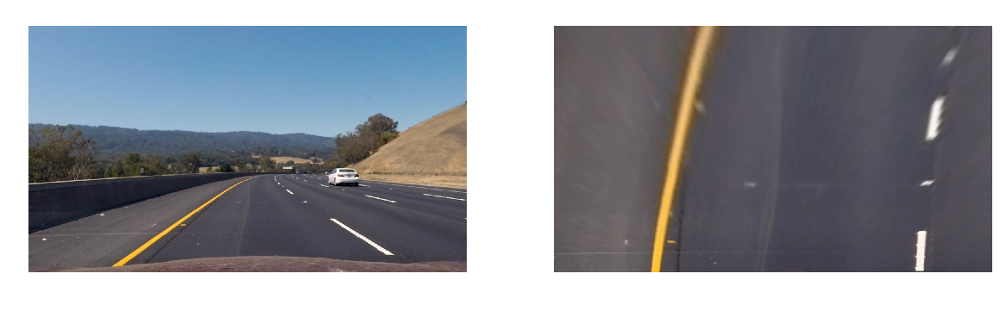

test_images\test4.jpg


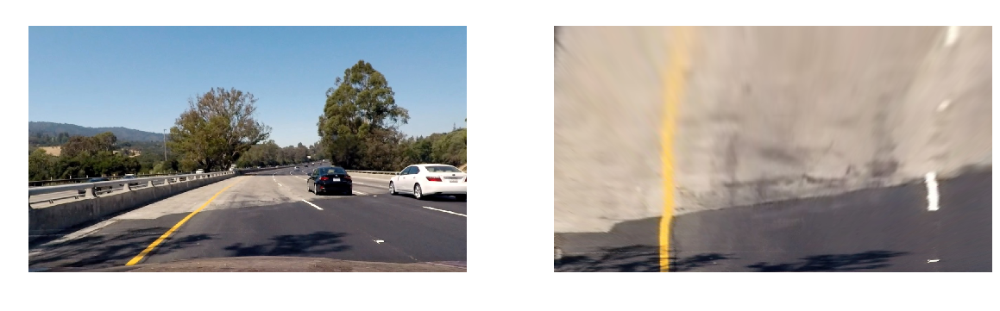

test_images\test5.jpg


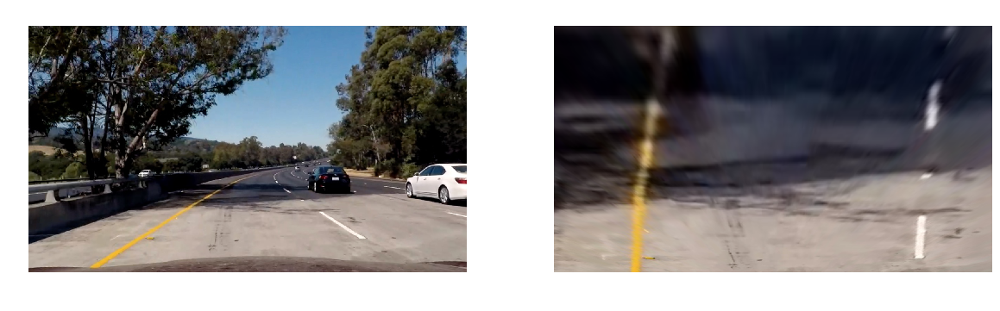

test_images\test6.jpg


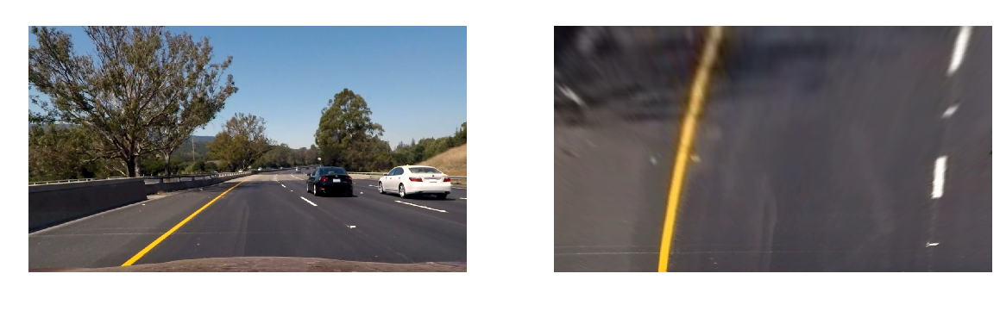

In [97]:
for file in glob.glob('test_images/*.jpg'):
    img = cv2.imread(file)
    
    print (file)
    corrected = pipeline.undistort(img)
    topdown = pipeline.transform_topdown(corrected)
    display_images(corrected, topdown)
